In [1]:
n_components = 15

# PCA Clustering
1. Use sentence-transformer to embed each sentence
1. Use `scikit learn` for PCA clustering
1. Examine the contents of each cluster 
2. Reference the map back to the sentence to determine an appropriate label for the entire cluster


In [2]:
!pip install texthero -q
!pip install sentence-transformers -q
!pip install hdbscan -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torcheia 1.0.0 requires torch==1.5.1, but you have torch 1.13.1 which is incompatible.


In [3]:
from nltk.tokenize import sent_tokenize
import pandas as pd
import numpy as np
import texthero as hero
import os

# Identify the working directory and data files
working_directory = './pca_clustering'

# Create the working directory if needed
try:
    os.makedirs(working_directory, exist_ok=True)
except OSError as error:
    print(f"Error creating {working_directory}: {error}")

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 45.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for en_core_web_sm: filename=en_core_web_sm-2.3.1-py3-none-any.whl size=12047086 sha256=d254c1c976f72263d634edfb49fb7defcd2ce5d12b690d8e59a6818cbb2c721e
  Stored in directory: /home/ec2-user/.cache/pip/wheels/b7/0d/f0/7ecae8427c515065d75410989e15e5785dd3975fe06e795cd9
Successfully built en_core_web_sm
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [4]:
data_file = './data_stratification/qbj_2020_strata.csv'

# Read the data into a pandas dataframe
df = pd.read_csv(data_file,           # The data file being read, from the variable assignment above
                 on_bad_lines='warn', # This tells Pandas to only warn on bad lines vs causing an error
                 dtype='str')         # This tells Pandas to treat all numbers as words

In [5]:
# The column names were reset here because the CSV import was
# bringing in two unnamed columns for the IDs
df.columns = ['ID1', 'ID2', 'FOI_TEXT', 'DEVICE_PROBLEM_CODE',
       'DEVICE_PROBLEM_TEXT', 'GENERIC_NAME', 'DEVICE_REPORT_PRODUCT_CODE',
       'UDI-DI', 'UDI-PUBLIC', 'DATE_OF_EVENT', 'REPORTER_OCCUPATION_CODE',
       'REPORT_DATE', 'EVENT_LOCATION', 'SOURCE_TYPE']

In [6]:
df.shape

(2763, 14)

In [7]:
df.head(3)

,ID1,ID2,FOI_TEXT,DEVICE_PROBLEM_CODE,DEVICE_PROBLEM_TEXT,GENERIC_NAME,DEVICE_REPORT_PRODUCT_CODE,UDI-DI,UDI-PUBLIC,DATE_OF_EVENT,REPORTER_OCCUPATION_CODE,REPORT_DATE,EVENT_LOCATION,SOURCE_TYPE
0,1969025,2146218,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,3283,Wireless Communication Problem,CONTINUOUS GLUCOSE MONITOR,QBJ,NaN,NaN,07/30/2020,000,NaN,I,CONSUMER
1,1426265,1554877,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,3283,Wireless Communication Problem,CONTINUOUS GLUCOSE MONITOR,QBJ,00386270000385,00386270000385,06/05/2020,000,NaN,I,CONSUMER
2,2609625,2840023,IT WAS REPORTED THAT TRANSMITTER FAILED ERROR ...,1435,No Device Output,CONTINUOUS GLUCOSE MONITOR,QBJ,00386270000385,00386270000385,10/05/2020,000,NaN,I,CONSUMER


## Sentence-ize the FOI_TEXT Data 
Before the `FOI_TEXT` can be processed, it needs to be broken up into sentences.

For further analysis, each sentence needs to be associated with the `FOI_TEXT` row that it came from.

[This discussion from Stack Overflow](https://stackoverflow.com/a/43922444/2308522) provides a suggestion for breaking the code into a dataframe of sentences with each sentence retaining the ID of the row where it was originally located.

[This page from the Pandas documentation](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.itertuples.html) provides details on using the `itertuples()` function to process the rows of the dataframe.

In [8]:
sentences = []

# Using itertuples(), the columns must be addressed using thier position.
# Here's a map of position to name:
# row[1]: ID1
# row[3]: FOI_TEXT
# row[5]: DEVICE_PROBLEM_TEXT
for row in df.itertuples():
    for sentence in row[3].split('.'):
        if sentence != '':
            sentences.append([row[1],row[5],sentence])

sentences_df = pd.DataFrame(sentences, columns=['ID1','DEVICE_PROBLEM_TEXT','SENTENCE'])

In [9]:
sentences_df.shape

(12399, 3)

In [10]:
sentences_df.head(3)

,ID1,DEVICE_PROBLEM_TEXT,SENTENCE
0,1969025,Wireless Communication Problem,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...
1,1969025,Wireless Communication Problem,THE TRANSMITTER ULTIMATELY REGAINED CONNECTIO...
2,1969025,Wireless Communication Problem,NO ADDITIONAL PATIENT OR EVENT INFORMATION WA...


## Run the PCA Pipeline
Now that each `FOI_TEXT` has been sentencized, the PCA pipeline can be run.

In [11]:
from sentence_transformers import SentenceTransformer

# define the document embedding model
# https://www.sbert.net/docs/pretrained_models.html
embedder = SentenceTransformer('all-MiniLM-L6-v2')

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

In [12]:
sentences_df['EMBED'] = sentences_df['SENTENCE'].apply(embedder.encode)
sentences_df.head(3)

,ID1,DEVICE_PROBLEM_TEXT,SENTENCE,EMBED
0,1969025,Wireless Communication Problem,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,"[0.0034748917, 0.043741446, -0.005506493, 0.05..."
1,1969025,Wireless Communication Problem,THE TRANSMITTER ULTIMATELY REGAINED CONNECTIO...,"[-0.041658804, 0.052052416, 0.0008737245, 0.04..."
2,1969025,Wireless Communication Problem,NO ADDITIONAL PATIENT OR EVENT INFORMATION WA...,"[0.025140468, 0.054037955, -0.032763645, 0.007..."


In [13]:
len(sentences_df.loc[0]['EMBED'])

384

In [14]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# "np.array([i for i in sentences_df['EMBED']])" Converts the data into a 2d array
embed_scaled = scaler.fit_transform(np.array([i for i in sentences_df['EMBED']]))

In [15]:
embed_scaled

array([[0.6104516 , 0.5603009 , 0.41348875, ..., 0.5896765 , 0.4527775 ,
        0.4872991 ],
       [0.4177134 , 0.59542996, 0.43630058, ..., 0.68378276, 0.59077674,
        0.4119441 ],
       [0.70297194, 0.60382247, 0.3160335 , ..., 0.5154353 , 0.4212417 ,
        0.40828767],
       ...,
       [0.8482734 , 0.828407  , 0.46111125, ..., 0.25619125, 0.62865317,
        0.59439254],
       [0.5041959 , 0.37738454, 0.58416235, ..., 0.57327324, 0.5786286 ,
        0.61850226],
       [0.34374842, 0.63194394, 0.38453323, ..., 0.6826074 , 0.66730905,
        0.551384  ]], dtype=float32)

In [18]:
from sklearn.decomposition import PCA

# https://www.mikulskibartosz.name/pca-how-to-choose-the-number-of-components/

# run it with the number of components specified by the variable n_components
pca = PCA(n_components=n_components)

# fit it to our data
pca_result = pca.fit_transform(embed_scaled)

/home/ec2-user/anaconda3/envs/amazonei_pytorch_latest_p37/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [ ]:
len(pca_result)

12399

In [20]:
pca_result

array([[-0.9986599 , -0.8240616 , -0.7977769 , ..., -0.89278823,
         0.44990015,  0.40971762],
       [-0.9559599 , -0.6479198 , -0.43272835, ..., -1.064532  ,
         0.6987418 ,  0.4605582 ],
       [ 1.2157582 , -0.19802314, -0.04010595, ...,  0.3582124 ,
         0.5513073 , -0.41970742],
       ...,
       [ 2.6174548 , -0.42842963, -0.92314833, ..., -0.07046726,
        -0.08058631, -0.00622395],
       [-0.55864716, -0.6374439 ,  0.5305099 , ...,  0.67285645,
        -0.63573396,  1.0590993 ],
       [-0.24635103, -1.0546018 ,  0.80088526, ...,  0.19778235,
        -0.20395593,  0.34680343]], dtype=float32)

## Use the PCA Results to Generate a Scree Plot

In PCA (Principal Component Analysis), the eigenvalues correspond to the variance explained by each principal component. They are typically extracted from the PCA data using the `explained_variance_` or `explained_variance_ratio_` attribute of the PCA object.

The `explained_variance_` attribute returns the eigenvalues (i.e., variance explained) of each principal component in descending order. The sum of all eigenvalues equals the total variance in the original data.

The `explained_variance_ratio_` attribute returns the proportion of variance explained by each principal component, which is the eigenvalue divided by the total variance in the original data.

Note that the `explained_variance_ratio_` attribute is often more useful than the `explained_variance_` attribute, as it provides information about the relative importance of each principal component in explaining the total variance in the original data.

In [73]:
# Extract eigenvalues from PCA object
eigenvalues = pca.explained_variance_

# Extract eigenvalues as proportions from PCA object
# (in previous observations, the eigenvalue_proportions == eigenvalues)
eigenvalue_proportions = pca.explained_variance_ratio_

# the cumulative summary of the explained variance in PCA is a useful tool for understanding and summarizing the results of a PCA analysis. It provides a quick and intuitive summary of the underlying structure in the data, and can be used for both dimensionality reduction and interpretation.
cumulative_variance = np.cumsum(eigenvalues)

In [64]:
eigenvalues

array([0.16515681, 0.12807316, 0.09767031, 0.07197019, 0.06488358,
       0.04832136, 0.04283626, 0.03403568, 0.0321218 , 0.02922079,
       0.02190226, 0.02127303, 0.0179825 , 0.01641766, 0.01364401],
      dtype=float32)

In [60]:
cumulative_variance

array([0.16515681, 0.29322997, 0.39090028, 0.46287048, 0.52775407,
       0.57607543, 0.6189117 , 0.65294737, 0.68506914, 0.71428996,
       0.7361922 , 0.75746524, 0.7754477 , 0.7918654 , 0.80550945],
      dtype=float32)

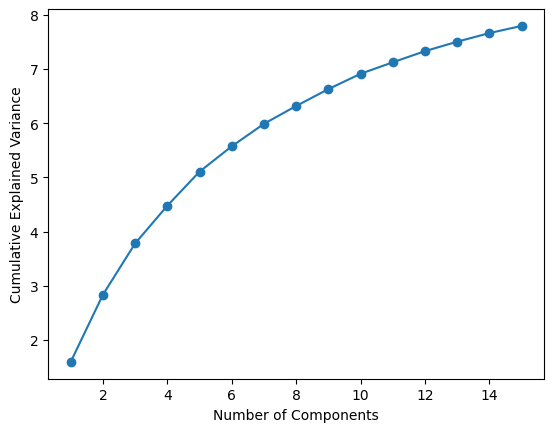

In [99]:
import matplotlib.pyplot as plt

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [94]:
import plotly.express as px

# Create scree plot using plotly.express
fig = px.line(x=np.arange(0, len(cumulative_variance)), y=pca.explained_variance_ratio_,
              markers=True, labels={'x': 'Principal Component', 'y': 'Proportion of Variance Explained'})
fig.write_html(f"{working_directory}/pca_cluster_notebook_14_scree_plot_{n_components}_components.html")

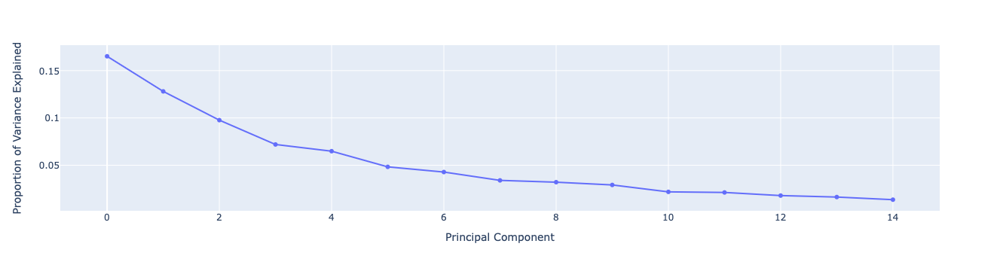

In [95]:
fig.show()

## Use the PCA Results for t-SNE and HDBSCAN

### t-SNE
t-SNE stands for t-Distributed Stochastic Neighbor Embedding. It is a popular nonlinear dimensionality reduction technique used in machine learning and data visualization.

The main goal of t-SNE is to reduce high-dimensional data into a lower-dimensional representation that captures the underlying structure of the data. It works by constructing a probability distribution over pairs of high-dimensional objects in such a way that similar objects have a high probability of being picked while dissimilar objects have a low probability of being picked. It then constructs a similar probability distribution over the low-dimensional points and minimizes the divergence between the two distributions using gradient descent. The resulting low-dimensional points can then be visualized in a scatter plot or used as features for other machine learning models.

t-SNE is especially useful for visualizing high-dimensional data in a 2D or 3D space, as it can reveal clusters, patterns, and structures in the data that may not be apparent in the original high-dimensional space.

### HDBSCAN
HDBSCAN stands for Hierarchical Density-Based Spatial Clustering of Applications with Noise. It is a popular density-based clustering algorithm used in machine learning and data analysis.

The main goal of HDBSCAN is to partition a dataset into clusters of high-density regions while identifying points that do not belong to any cluster (i.e., noise). It works by first constructing a hierarchy of clusters based on the density of the data points. It then determines the most stable partition of the data, which is the clustering that gives the best balance between the number of clusters and the density of the points within each cluster. The stability of the clustering is determined by a robustness criterion that takes into account the persistence of the clusters across different levels of the hierarchy.

HDBSCAN is particularly useful for clustering datasets that have complex structures and contain clusters of varying densities and shapes. It can handle datasets with noisy and sparse data points and is capable of detecting outliers and small clusters that may be overlooked by other clustering algorithms. 


In [ ]:
from sklearn.manifold import TSNE

# create a t-SNE object and fit and transform the PCA result
tsne = TSNE(n_components=3, init='pca', learning_rate='auto')

tsne_result = tsne.fit_transform(pca_result)

In [21]:
len(tsne_result)

12399

In [22]:
tsne_result

array([[  4.8905644 ,  -7.7189813 , -39.921566  ],
       [-25.30537   ,   0.41529694,  -0.75761664],
       [ 15.41846   ,  16.326385  ,   3.0465574 ],
       ...,
       [ 16.058264  ,  -3.2091596 , -10.352338  ],
       [-10.020511  , -20.747751  ,  28.179832  ],
       [  6.543837  , -33.48446   ,  21.176691  ]], dtype=float32)

In [25]:
from hdbscan import HDBSCAN
hdbscan = HDBSCAN()
clusters = hdbscan.fit_predict(tsne_result)

In [26]:
clusters

array([ -1,  -1, 162, ...,  83,  23,  36])

In [27]:
len(clusters)

12399

In [28]:
# Create a grouping of values by cluster value
# ie, clusters[0] and clusters[2] will have the same cluster value.
# sort by size (number of items in the group)
# determine how dense each cluster is 
# use the python 'counter' class

# after sorting, analyze and manually create the cluster 'affinity'
# create a new 'clusters' array with the value for the cluster affinity

# FUTURE: For example,
# classify senteneces into "3" classes
# then have "2" labels
# then combine the labels for the FOI_TEXT
# - use one label for the FOI_TEXT
# - another model or rule that takes the labels and FOI_TEXT as input and determines a single FOI_TEXT label
# - other aggregration strategies for the FOI_TEXT label...


# Reviewing the text
# - all the sentences in the cluster make sense and the entire cluster can be labeled the same
# - or the clustering was bad and has too many exceptions; data needs to be split into a much better clustering
#
# ie, they will be consistent and easily label-able or inconsistent and the clustering method needs to be revisited
# - switch out HDBSCAN
# - reduce dimensionality
# - others...


## Generate a Scatterplot
Using the PCA data, generate a 2D scatterplot.

- [Plotly Color Scales](https://plotly.com/python/builtin-colorscales/)

In [29]:
# break the PCA coordinates into X and Y columns
sentences_df[['x','y','z']] = tsne_result.tolist()

# Merge the PCA data with the main data frame
combined = pd.merge(
        df, 
        sentences_df, 
        on='ID1', 
        how='inner')

combined.to_csv(f"{working_directory}/pca_cluster_notebook_14_{n_components}.csv", index=False)


## Write the Plot to a File

In [30]:
# Using the plotly express library to write the graph
# https://plotly.com/python/interactive-html-export/
import plotly.express as px

# https://plotly.com/python/figure-labels/
fig = px.scatter(
    combined, 
    x='x', 
    y='y',
    color=clusters,
    custom_data=['ID1', 'SENTENCE'],
    title="PCA Scatter Plot in 2D"
)

# https://stackoverflow.com/questions/59057881/python-plotly-how-to-customize-hover-template-on-with-what-information-to-show
fig.update_traces(
    hovertemplate="<br>".join([
        "x: %{x}",
        "y: %{y}",
        "ID1: %{customdata[0]}",
        "S: %{customdata[1]}"
    ])
)

# write the 2d scatter plot to a file in the working directory
fig.write_html(f"{working_directory}/pca_cluster_notebook_14_2d_{n_components}.html")

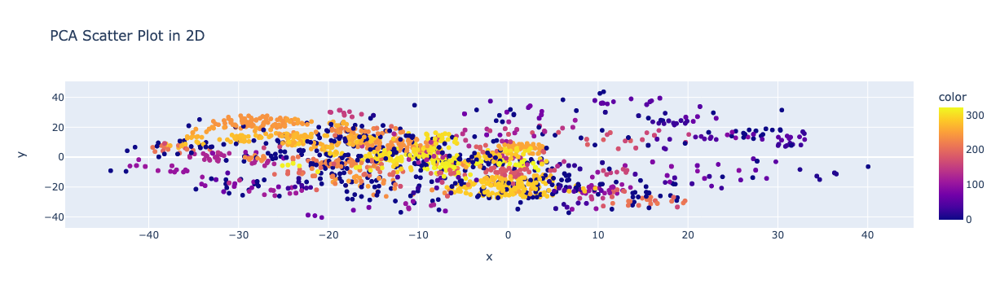

In [31]:
fig.show()

## Generate a 3D Scatter Plot
Using the PCA data, generate a 3D scatterplot.

In [32]:
import plotly.graph_objs as go

z = np.linspace(0, 10, 50)
x = np.cos(z)
y = np.sin(z)

trace = go.Scatter3d(
    x = sentences_df['x'], 
    y = sentences_df['y'], 
    z = sentences_df['z'], 
    mode = 'markers', 
    marker = dict(
      color=clusters,
      colorscale = 'Plasma'
    )
)

layout = go.Layout(title = "PCA Scatter Plot in 3D")
fig_3d = go.Figure(data = [trace], layout = layout)

# write the 3d scatter plot to a file in the working directory
fig_3d.write_html(f"{working_directory}/pca_cluster_notebook_14_3d_{n_components}.html")

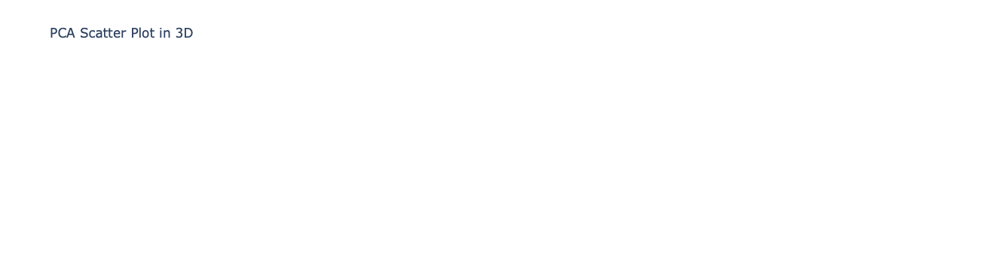

In [33]:
fig_3d.show()

## Upload All Output to an S3 Bucket

In [96]:
import os
import subprocess

bucket = "praxis-2023-html-output"
website = f"http://{bucket}.s3-website-us-west-2.amazonaws.com"

# Get a list of all the files in the directory
file_list = os.listdir(working_directory)

# Sort the file list alphabetically
file_list.sort()

# Create the HTML file and write the header
with open(os.path.join(working_directory, 'index.html'), 'w') as f:
    f.write('''<html>
        <head>
            <title>Praxis 2023 HTML Output</title>
            <style>
                table {
                    border-collapse: collapse;
                    width: 100%;
                }
                th, td {
                    text-align: left;
                    padding: 8px;
                }
                th {
                    background-color: #007bff;
                    color: #fff;
                    font-weight: bold;
                }
                tr:nth-child(even) {
                    background-color: #f2f2f2;
                }
                tr:hover {
                    background-color: #ddd;
                }
            </style>
        </head>
        <body>
            <table>
                <tr><th>Name</th><th>Size</th></tr>\n
    ''')

    # Loop through each file and add a row to the table
    for file_name in file_list:
        if file_name == '.ipynb_checkpoints':
            continue

        if file_name == 'index.html':
            continue

        file_path = os.path.join(working_directory, file_name)
        file_size = os.path.getsize(file_path)
        f.write(f'<tr><td><a href="{website}/{file_name}">{file_name}</a></td><td>{int(file_size / 1048576)} MB</td></tr>\n')

    # Write the footer and close the file
    f.write('</table></body></html>')

command = ["aws", "s3", "sync", working_directory, f"s3://{bucket}", "--exclude", f"pca_clustering/.ipynb_checkpoints/*"]
# Run a command and wait for it to complete
output = subprocess.run(command, capture_output=True, text=True)

# Print the output
print(output.stdout)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Completed 2.5 KiB/3.6 MiB (63.0 KiB/s) with 2 file(s) remaining
upload: pca_clustering/index.html to s3://praxis-2023-html-output/index.html
Completed 2.5 KiB/3.6 MiB (63.0 KiB/s) with 1 file(s) remaining
Completed 258.5 KiB/3.6 MiB (3.9 MiB/s) with 1 file(s) remaining
Completed 514.5 KiB/3.6 MiB (7.5 MiB/s) with 1 file(s) remaining
Completed 770.5 KiB/3.6 MiB (10.7 MiB/s) with 1 file(s) remaining
Completed 1.0 MiB/3.6 MiB (14.0 MiB/s) with 1 file(s) remaining  
Completed 1.3 MiB/3.6 MiB (16.9 MiB/s) with 1 file(s) remaining  
Completed 1.5 MiB/3.6 MiB (19.9 MiB/s) with 1 file(s) remaining  
Completed 1.8 MiB/3.6 MiB (22.7 MiB/s) with 1 file(s) remaining  
Completed 2

# Next steps
- Need to identify and segregate clusters so FOI text can be manually reviewed.
